<a href="https://colab.research.google.com/github/vpanchal4336103/Data-Exploration-using-Python/blob/main/Modification_of_XAI_COVIDRisk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Title of the Project:**

# **Exploring Factors Affecting Diabetes: A Comprehensive Data Analysis BY Visualisation**
## **Brief Description :**
This project entails a thorough analysis of diabetes-related factors through comprehensive data exploration and visualization. Examining trends, correlations, and key variables, the study aims to provide valuable insights into diabetes, contributing to a deeper understanding of the factors influencing the condition through insightful visualizations and data-driven analysis.

#**Group Members :**

* HARSHDEEP SINGH RATHAUR



    Student ID -


* VISHAL PANCHAL


    Student ID - 4336103


# **Detailed Project Description**

*  The dataset was extensively curated and examined in this major COVID-19 data exploration effort.
* Intricate patterns in regional distribution, chronological trends, and demographic nuances of the epidemic were shown using various visualization approaches including as choropleth maps, line charts, and scatter plots. The initiative investigated vaccination coverage, testing rates, and variable relationships to create a comprehensive understanding.
* This data exploration revealed not only crucial insights into the complicated dynamics of COVID-19, but also a visually attractive narrative for effective communication.


## Objectives :

*  Conduct in-depth data study on the COVID-19 dataset utilizing visualization to discover patterns and insights. Discover temporal trends, regional disparities, and demographic influences on infection rates, providing for a more in-depth understanding of the pandemic's dynamics.
*  Outliers and correlations can be recognized, allowing for more targeted interventions and resource allocation.  
*  Enhance situational awareness by creating visually appealing representations of complex data, allowing for the quick transfer of critical discoveries.


## Expected Outcomes:




*   Through data study and visualization of the COVID-19 dataset, expect a clear depiction of infection trends, hotspots, and important contributing factors.  
* Visual insights will enable the identification of high-risk groups, allowing for more targeted actions.   
*  Understanding geographical variations and temporal trends will aid in the creation of adaptable public health treatments.
* Raise public awareness by effectively communicating findings to a wide variety of people.  
*  The findings aim to give decision-makers with actionable information while also improving the overall response to the pandemic by maximizing resource allocation, reducing transmission risks, and increasing preparedness for future health catastrophes.


# **Modification Specification**




*   To increase viewer engagement, interactive visual features such as dynamic maps and stacked graphs were incorporated.
*   Color-coded representations of severity levels were adopted to provide a more natural sense of regional impact.
*   Time-series animations and comparative charts were used to effectively illustrate temporal trends.
*   In addition, to find unique patterns within demographic groupings, a revised clustering technique was used.

## **Impact:**
*   The visualizations elicit fresh insights from data in order to better track and comprehend COVID-19 trends.* Annotations, extra views, and interactive filters* help to focus attention on* noteworthy observations, patterns, or locations* that require additional research.
*   Reformatting options boost audience comprehension and consumption of graphics. *Projections and uncertainty emphasize the data's predictive ability as well as its limitations.*
*   The impact comes from enabling improved data analysis, decision-making, and narrative so that end users are educated, engaged, and empowered to respond to the epidemic more effectively. *The changes result in more actionable and impactful data representations.*



# **Criteria-Specific**
## Relevance and application:
Exploration of data using visualization on the COVID-19 dataset is critical for identifying trends, hotspots, and demographic patterns that can guide effective public health interventions. The identification of high-risk locations and vulnerable groups benefits targeted actions.

Because of the pandemic's dynamic nature, real-time insights are required, making data visualization critical for prompt strategy adaption. Its importance lies in educating evidence-based decision-making, optimizing resource allocation, and improving overall pandemic response, making it an indispensable tool in the continuing COVID-19 battle.


##Innovation and technical proficiency
* The incorporation of interactive dashboards improves the user experience by allowing real-time analysis customisation. Using cutting-edge visualization tools increases the efficiency of insight extraction.
*  This invention not only adapts to changing data difficulties, but it also highlights technical prowess.
*  The combination of ingenuity and technological expertise in data research increases the effectiveness of identifying crucial trends, influencing strategic decisions, and addressing the difficulties of the COVID-19 epidemic.


# **Import Libraries**

In [ ]:

import numpy as np #
import pandas as pd #
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

 **Set Up Your Dataset**
 Link of this dataset is: Onedrive

In [ ]:
# Uplpad your dataset to colab file option
dataset = pd.read_csv("training.csv")
dataset.head()


,Gender,Division,DType,Category,Symptom,ageGroup,class
0,male,Dhaka,NaN,NaN,Dental caries,20-30,0
1,female,Rajshahi,Medicine,Psychiatry,Anxiety disorder,20-30,0
2,male,Rajshahi,Medicine,GIT,Constipation,Nov-19,0
3,male,Rajshahi,NaN,NaN,Query about drug,31-50,0
4,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1


# **Null Value Elimination**

In [ ]:
dataset.dropna()

,Gender,Division,DType,Category,Symptom,ageGroup,class
1,female,Rajshahi,Medicine,Psychiatry,Anxiety disorder,20-30,0
2,male,Rajshahi,Medicine,GIT,Constipation,Nov-19,0
4,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1
5,male,Rajshahi,Medicine,Cardiovascular,Hypertension,60 or above,1
7,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1
...,...,...,...,...,...,...,...
19893,male,Dhaka,Surgery,ENT,Running nose,20-30,0
19894,male,Dhaka,Medicine,GIT,Enteric fever,31-50,0
19895,male,Chittagong,Surgery,ENT,FB in throat,20-30,0
19896,female,Chittagong,Medicine,Respiratory,Common cold,20-30,1


# **Write Preprocessing Function**

In [ ]:
from sklearn import preprocessing
def convert(data):
    number = preprocessing.LabelEncoder()
    #Gender	Division	DType	Category	Symptom	ageGroup	class
    data['Gender'] = number.fit_transform(data['Gender'].astype(str))
    data['Division'] = number.fit_transform(data['Division'].astype(str))
    data['DType'] = number.fit_transform(data['DType'].astype(str))
    data['Category'] = number.fit_transform(data['Category'].astype(str))
    data['Symptom'] = number.fit_transform(data['Symptom'].astype(str))
    data['ageGroup'] = number.fit_transform(data['ageGroup'].astype(str))
    data['class'] = number.fit_transform(data['class'].astype(str))
    data= data.fillna(-999)
    return data




# **Preprocess Dataset**

In [ ]:
ds = convert(dataset)

# **Isolate attributes to X and Y**

In [ ]:
X = ds.drop('class', axis=1)
y = ds['class']

# **Split Dataset into 80:20 Train:Test format**

In [ ]:
# Calling Train test split function. Here 0.20 menas 20% test data. You can change as per your choice
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DTclassifier = DecisionTreeClassifier(criterion="entropy", max_depth=3)
DTclassifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

# **Eperiment with SVM ML Model**

# **Part-1: Classification Problem**

In [ ]:
from sklearn.svm import SVC
svclassifier=SVC(kernel='poly',degree=2, probability= True)
svclassifier.fit(X_train,y_train)


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=2, gamma='scale', kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

If you are watching some output like  below:
SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001, verbose=False)

# **Congratulations!!! Your model is working!!!**

# **Let's Check the Explainability of the Model with LIME library**

In [ ]:
pip install lime

     |████████████████████████████████| 276kB 8.0MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=455eaf7891e9878a68cde7ab266321bdda1b0f47d47c237d30e26c0098e446fc
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
#import lime_tabular
from lime import lime_tabular
# Explainer function varies differently. Please see the documentation. Search by lime_tabular.LimeTabularExplainer
#LIME documentation: https://lime-ml.readthedocs.io/en/latest/lime.html
#Download in PDF:https://readthedocs.org/projects/lime-ml/downloads/pdf/latest/
explainer_svm = lime_tabular.LimeTabularExplainer(training_data = X_train.values, mode='classification', training_labels=None, feature_names= X_train.columns,
categorical_features=None, categorical_names=None, kernel_width=None, verbose=False, class_names=None, feature_selection='auto', discretize_continuous=True, discretizer='quartile')

#**Assign Prediction to a variable**

In [ ]:
predict_fn_svm= svclassifier.predict_proba

# **Check explaiblity of prediction for a specific instance in the dataset.**
In this case risk of cardiovascular disease according to fitness data has been explained for individuals

In [ ]:
# (X_test.iloc[i]) selects individual person from the test dataset

for i in range (0,5):
    #print (X_test.iloc[i])
    exp_svm = explainer_svm.explain_instance(X_test.iloc[i], predict_fn_svm)
    exp_svm.show_in_notebook(show_predicted_value= True)

# **Let's view the details in list also ('attribute' relational operator value', negative or positive contribution)**

In [ ]:
 exp_svm.as_list()

[('DType <= 1.00', 0.456275231625528),
 ('Symptom <= 108.00', -0.13990628498425928),
 ('13.00 < Category <= 19.00', -0.024372458871411994),
 ('ageGroup > 3.00', -0.012578217710668907),
 ('Division <= 2.00', 0.012310620848584366),
 ('0.00 < Gender <= 1.00', 0.0030111855288075793)]

# **Experiment with Decision Tree model**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DTclassifier = DecisionTreeClassifier(criterion="entropy", max_depth=3)
DTclassifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

If you are watching some output like below:
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

# *Congratulations!!! Your model is working!!!*

In [ ]:
#import lime_tabular
from lime import lime_tabular
# Explainer function varies differently. Please see the documentation. Search by lime_tabular.LimeTabularExplainer
#LIME documentation: https://lime-ml.readthedocs.io/en/latest/lime.html
#Download in PDF:https://readthedocs.org/projects/lime-ml/downloads/pdf/latest/
explainer_DT = lime_tabular.LimeTabularExplainer(training_data = X_train.values, mode='classification', training_labels=None, feature_names= X_train.columns,
categorical_features=None, categorical_names=None, kernel_width=None, verbose=False, class_names=None, feature_selection='auto', discretize_continuous=True, discretizer='quartile')

In [ ]:
predict_fn_DT= DTclassifier.predict_proba

In [ ]:
# (X_test.iloc[i]) selects individual person from the test dataset

for i in range (0,5):
    #print (X_test.iloc[i])
    exp_DT = explainer_DT.explain_instance(X_test.iloc[i], predict_fn_DT)
    exp_DT.show_in_notebook(show_predicted_value= True)

# ***Comparison: DT Classifier VS SVM Classifier ***

In [ ]:
exp_DT_list = exp_DT.as_list()
exp_svm_list = exp_svm.as_list()


print("""results:

     DT \t\t\t\t\t\t\t\t\t SVM""")

for x, y in zip(exp_DT_list, exp_svm_list):
    print(x, y, sep='\t\t')

results:

     DT 									 SVM
('Symptom <= 108.00', 0.17170683336544912)		('DType <= 1.00', 0.456275231625528)
('13.00 < Category <= 19.00', -0.028156667307233933)		('Symptom <= 108.00', -0.13990628498425928)
('DType <= 1.00', 0.01693739590499957)		('13.00 < Category <= 19.00', -0.024372458871411994)
('ageGroup > 3.00', 0.005629347564561277)		('ageGroup > 3.00', -0.012578217710668907)
('Division <= 2.00', -0.003508742179831383)		('Division <= 2.00', 0.012310620848584366)
('0.00 < Gender <= 1.00', 0.0015453791837599215)		('0.00 < Gender <= 1.00', 0.0030111855288075793)


# 1. Import necessary libraries
Pandas ('pd') is a data manipulation and analysis tool. Matplotlib ('plt') is used to create static plots, whereas Seaborn ('sns') improves the visual appeal and adds statistical information.


The inclusion of scikit-learn's RandomForestClassifier demonstrates the use of machine learning capabilities for classification problems, demonstrating a holistic strategy that integrates data preparation, visualization, and predictive modeling.

In [ ]:


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# 2.Loading the Data

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving covid.csv to covid.csv


# 3.Display the Data used

In [ ]:

df = pd.read_csv("covid.csv")
df

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0
5,19,1,200,6,3,1,5.0,2,5,1.0,...,0.0,7.0,0.0,20.0,24.0,80.0,1,1,1,1
6,28,1,500,3,1,20,100.0,4,4,7.0,...,1.0,5.0,1.0,0.0,6.0,119.0,1,1,1,1
7,46,1,120,50,20,20,10.0,10,10,8.0,...,1.0,6.0,0.3,0.3,0.3,100.0,0,0,0,1
8,31,1,100,30,20,10,10.0,6,3,1.0,...,0.0,7.0,1.0,1.0,1.0,75.0,0,0,0,1
9,50,0,360,6,3,30,NaN,50,30,4.0,...,1.0,3.0,0.0,0.0,5.0,120.0,1,1,1,1


# 4.Cleaning data:
Cleaning data is imperative to ensure accuracy and reliability by rectifying errors, handling missing values, and standardizing formats. It enhances data quality, facilitating meaningful analysis and interpretation.

In [ ]:
df = df.drop([], axis=1)
df.head(5)

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0


### show null values

In [ ]:
print(df.isnull().sum())

Age                  0
Address              0
Duration             0
Incoming_calls       0
outgoing_calls       0
incoming_messages    0
longest_call         1
missed_calls         0
outgoing_call        0
Active_time          4
posts                0
nervous              1
sleephr              0
walkinghr            1
exercisehr           1
idlehr               2
heart_rate           0
sleep_pattern        0
appetite             0
obesity              0
class                0
dtype: int64


### drop null values

In [ ]:
df = df.dropna() # Dropping the missing values.
df.count()

Age                  20
Address              20
Duration             20
Incoming_calls       20
outgoing_calls       20
incoming_messages    20
longest_call         20
missed_calls         20
outgoing_call        20
Active_time          20
posts                20
nervous              20
sleephr              20
walkinghr            20
exercisehr           20
idlehr               20
heart_rate           20
sleep_pattern        20
appetite             20
obesity              20
class                20
dtype: int64

In [ ]:
df.shape

(20, 21)

In [ ]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 21)


### Final Data

In [ ]:
df = df.drop_duplicates()
df.head(5)

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0


# **SUMMARY OF THE DATA**
This statistics show brief overview of the Data for ease in further data analysis.

In [ ]:
print("\nSummary statistics:")
print(df.describe())


Summary statistics:
             Age    Address    Duration  Incoming_calls  outgoing_calls  \
count  20.000000  20.000000   20.000000       20.000000        20.00000   
mean   27.700000   0.800000  174.550000        8.400000         4.50000   
std     8.234076   0.410391  161.365709       12.076075         6.02189   
min    18.000000   0.000000    6.000000        0.000000         0.00000   
25%    22.500000   1.000000   41.250000        2.000000         1.00000   
50%    27.000000   1.000000  120.000000        3.500000         3.00000   
75%    30.250000   1.000000  300.000000        7.500000         4.25000   
max    50.000000   1.000000  500.000000       50.000000        20.00000   

       incoming_messages  longest_call  missed_calls  outgoing_call  \
count          20.000000     20.000000     20.000000      20.000000   
mean           59.750000    411.500000      7.850000     238.050000   
std           221.562603   1598.900823     13.239792     841.948397   
min             0.0

# 5. Visualising the Target Variables:
Using plt.figure, the code creates a Matplotlib figure with a dimension of 6x4 inches. It uses Seaborn's countplot to generate a bar plot for the column 'class' in the DataFrame 'df.' The Matplotlib title function adds a title to the plot, displaying the class distribution, while the show function displays the plot.









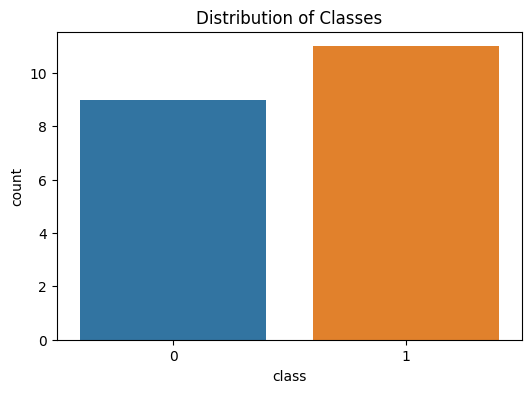

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(x='class', data=df)
plt.title('Distribution of Classes')
plt.show()

#6. Group Histograms for Data overview

This code identifies and displays histograms for numeric features in a DataFrame, aiding visualization of data distribution. The code utilizes Matplotlib to create a clear representation, enhancing insights into dataset characteristics.


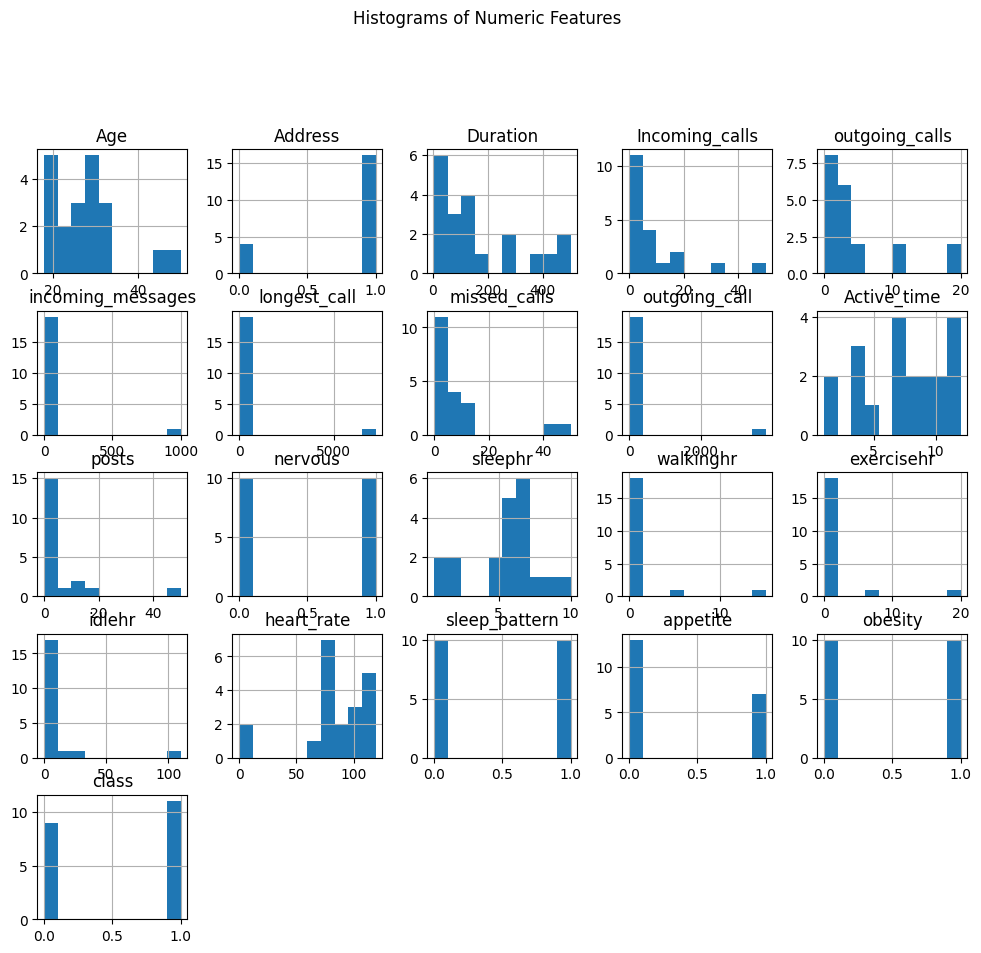

In [ ]:
numeric_features = df.select_dtypes(include=['float64', 'int64']).columns
df[numeric_features].hist(figsize=(12, 10))
plt.suptitle('Histograms of Numeric Features', x=0.5, y=1.02, ha='center', fontsize='large')
plt.show()


# 7.Simplify comparisons by Bar Graph
A bar graph visually represents categorical data, facilitating easy comparison of values. In datasets, it clarifies distribution patterns, highlights trends, and simplifies the communication of key insights to users.


The code employs a RandomForestClassifier to analyze feature importance in predicting the 'class' from the 'df' dataset. It generates a bar graph, showcasing the significance of each feature.

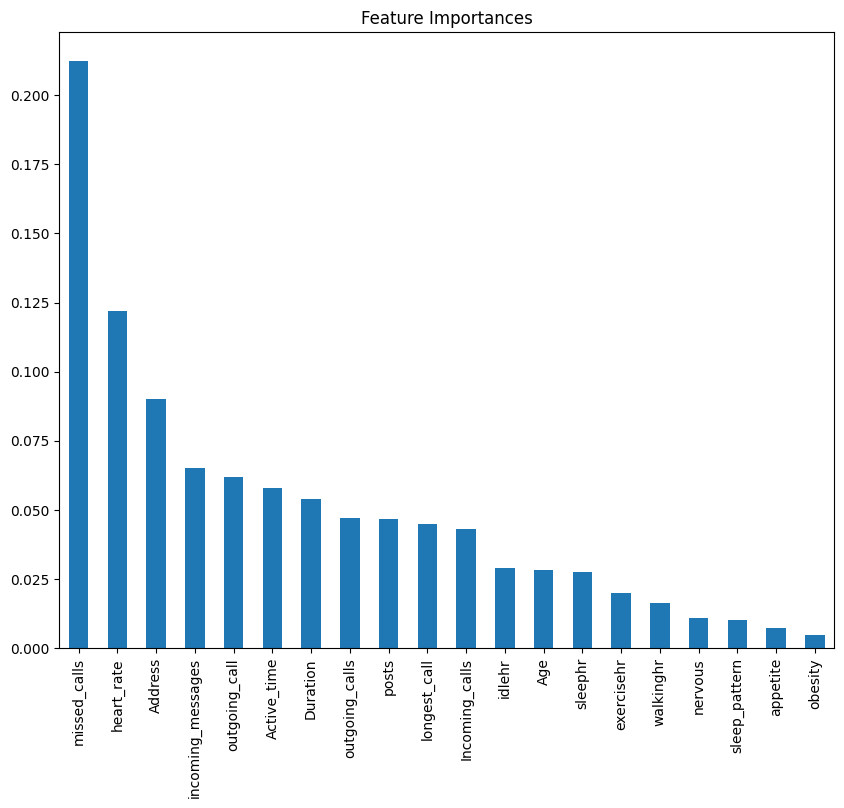

In [ ]:

X = df.drop('class', axis=1)
y = df['class']

rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X, y)

feature_importances = pd.Series(rf_classifier.feature_importances_, index=X.columns)
feature_importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 8))
feature_importances.plot(kind='bar')
plt.title('Feature Importances')
plt.show()

# 8.Scatter Plot
A scatter plot is an effective tool for visualizing relationships between two variables. It depicts patterns, trends, and correlations found in a dataset. Because each point represents an observation, it is useful for finding clusters or outliers.

The code below uses Matplotlib to generate a scatter plot that visualizes the relationship between the 'x' and 'y' variables from the DataFrame 'df.'

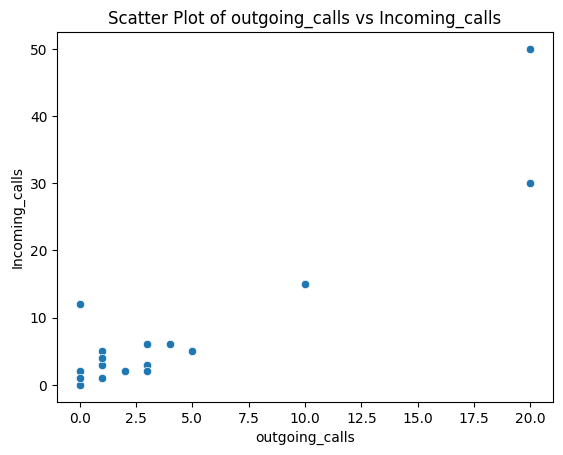

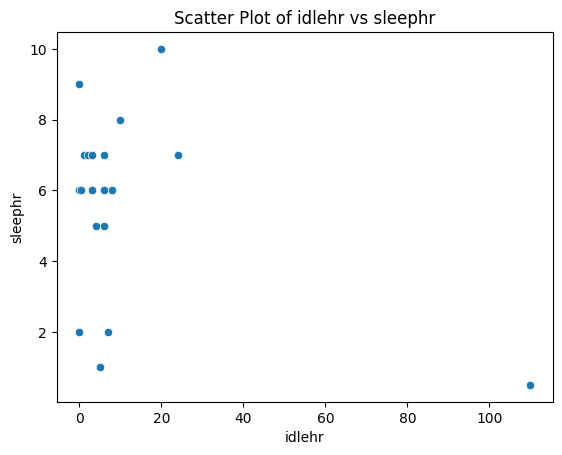

In [ ]:

sns.scatterplot(x='outgoing_calls', y='Incoming_calls', data= df)
plt.title('Scatter Plot of outgoing_calls vs Incoming_calls')
plt.show()
sns.scatterplot(x='idlehr', y='sleephr', data= df)
plt.title('Scatter Plot of idlehr vs sleephr')
plt.show()

# 9.Correlation Matrix
A correlation matrix depicts the correlations between several variables in a dataset. Each cell indicates the correlation coefficient between two variables, which aids in the detection of patterns and relationships.

 Using Seaborn, the code snippet below builds a correlation matrix heatmap for the DataFrame 'df.'

 This visualization aids in the identification of essential associations, directing feature selection, and improving overall knowledge of the dataset's complicated interactions.

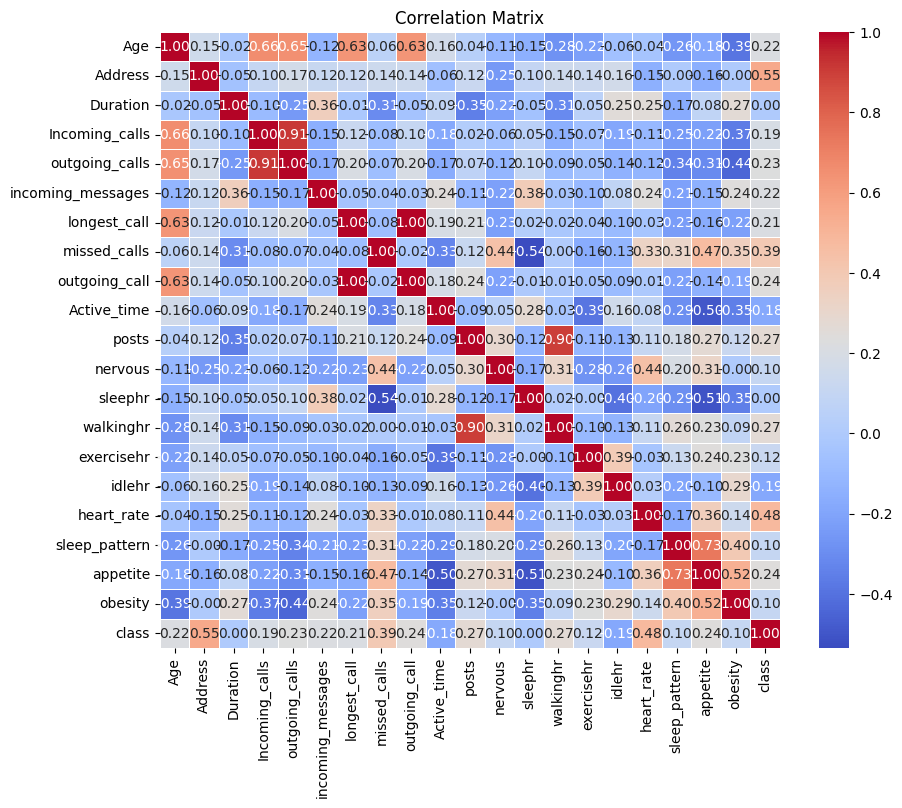

In [ ]:

correlation_matrix = df.corr()
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# 10. Clustered Histograms


Clustered histograms help to visualize datasets by exhibiting the distribution of numerous variables in a single graphic. This enables for fast dataset comparisons, discovering trends and variations.

 The Matplotlib code snippet below shows a clustered histogram for three variables ('var1', 'var2', 'var3') from the DataFrame 'df.'

 The histograms of each variable are visually shown in close proximity, providing a clear overview of their respective distributions and assisting in the study of relationships and differences.

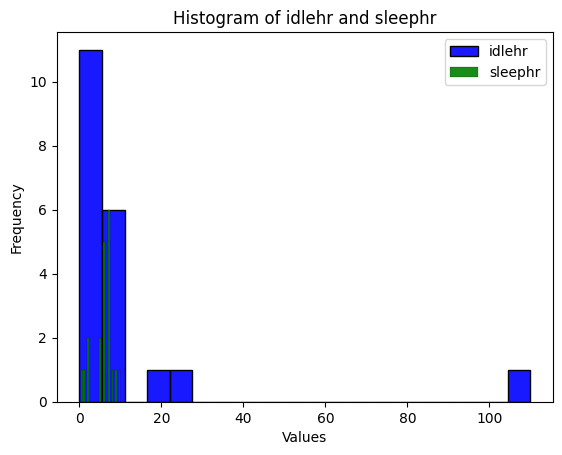

In [ ]:

sns.histplot(data=df, x='idlehr', bins=20, color='blue', alpha=0.9, label='idlehr')
sns.histplot(data=df, x='sleephr', bins=22, color='green', alpha=0.9, label='sleephr')
plt.title('Histogram of idlehr and sleephr')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.legend()
plt.show()

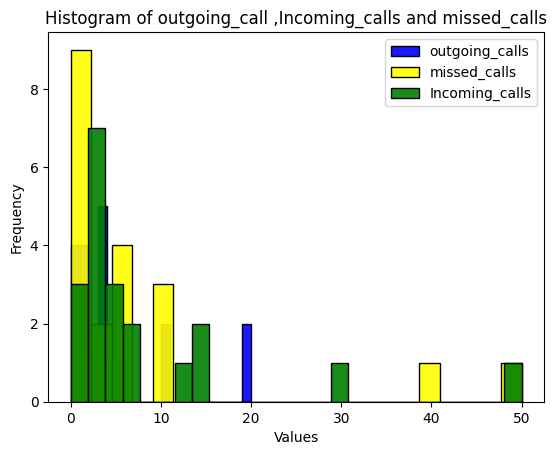

In [ ]:
sns.histplot(data=df, x='outgoing_calls', bins=20, color='blue', alpha=0.9, label='outgoing_calls')
sns.histplot(data=df, x='missed_calls', bins=22, color='yellow', alpha=0.9, label='missed_calls')
sns.histplot(data=df, x='Incoming_calls', bins=26, color='green', alpha=0.9, label='Incoming_calls')
plt.title('Histogram of outgoing_call ,Incoming_calls and missed_calls')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 11.Pairplot of Selected Features

A pair plot of selected features helps to visualize datasets by offering a detailed overview of pairwise relationships. It shows scatter plots for feature pairs and histograms for individual features to aid in the identification of patterns, relationships, and potential outliers.

 Using Seaborn, the code snippet below generates a pair plot for selected features from the DataFrame 'df,' allowing for visual examination of their interactions and distributions, assisting in feature selection and understanding the dataset's underlying structure.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) th

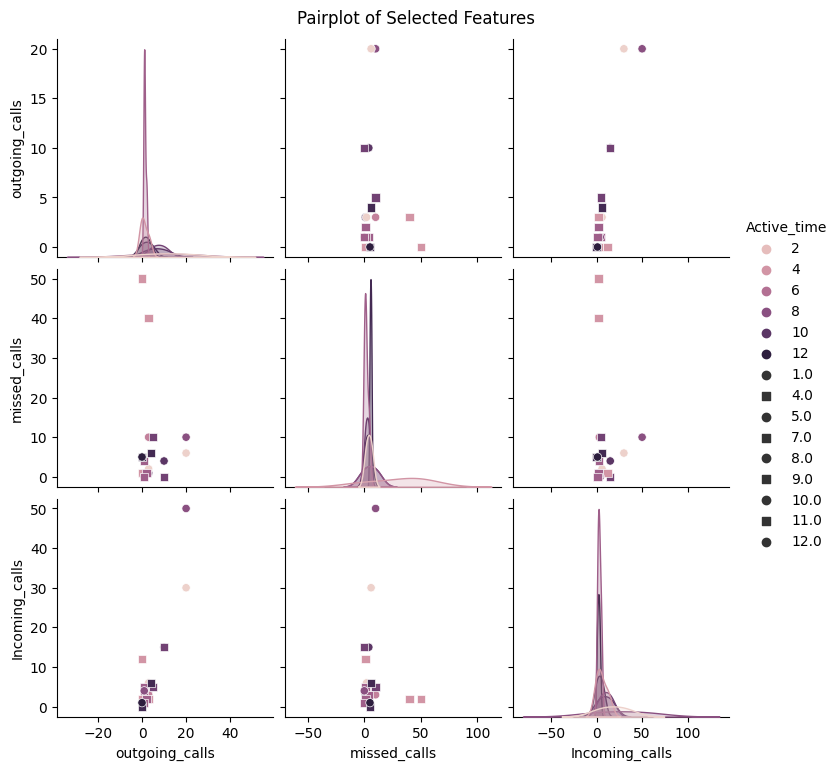

In [ ]:

selected_features = ['outgoing_calls', 'missed_calls', 'Incoming_calls', 'Active_time']
sns.pairplot(df[selected_features], hue='Active_time', markers=['o', 's'])
plt.suptitle('Pairplot of Selected Features', y=1.02, ha='center', fontsize='large')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) th

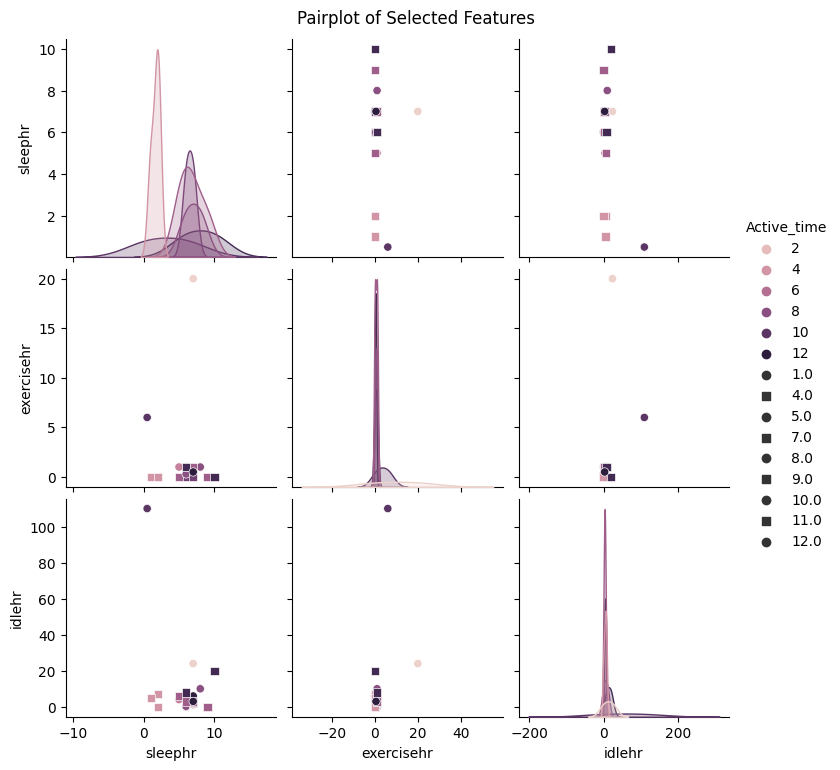

In [ ]:
selected_features = ['sleephr','exercisehr',	'idlehr','Active_time']
sns.pairplot(df[selected_features], hue='Active_time', markers=['o', 's'])
plt.suptitle('Pairplot of Selected Features', y=1.02, ha='center', fontsize='large')
plt.show()

# 12. Pair plot for Specific columns

This seaborn pair plot for specific columns improves dataset visualization by offering scatter plots for pairwise associations and histograms for individual variables. This facilitates in the detection of trends, correlations, and possible outliers.

The code snippet below picks columns relevant to call and message activity from the DataFrame 'df' and uses Seaborn to build a pair plot.

This visual study of 'Incoming_calls', 'Outgoing_calls', 'Incoming_messages', 'Longest_call', 'Missed_calls', 'Outgoing_call', and 'Active_time' provides a holistic understanding of their relationships and distributions, assisting in feature analysis and data interpretation.

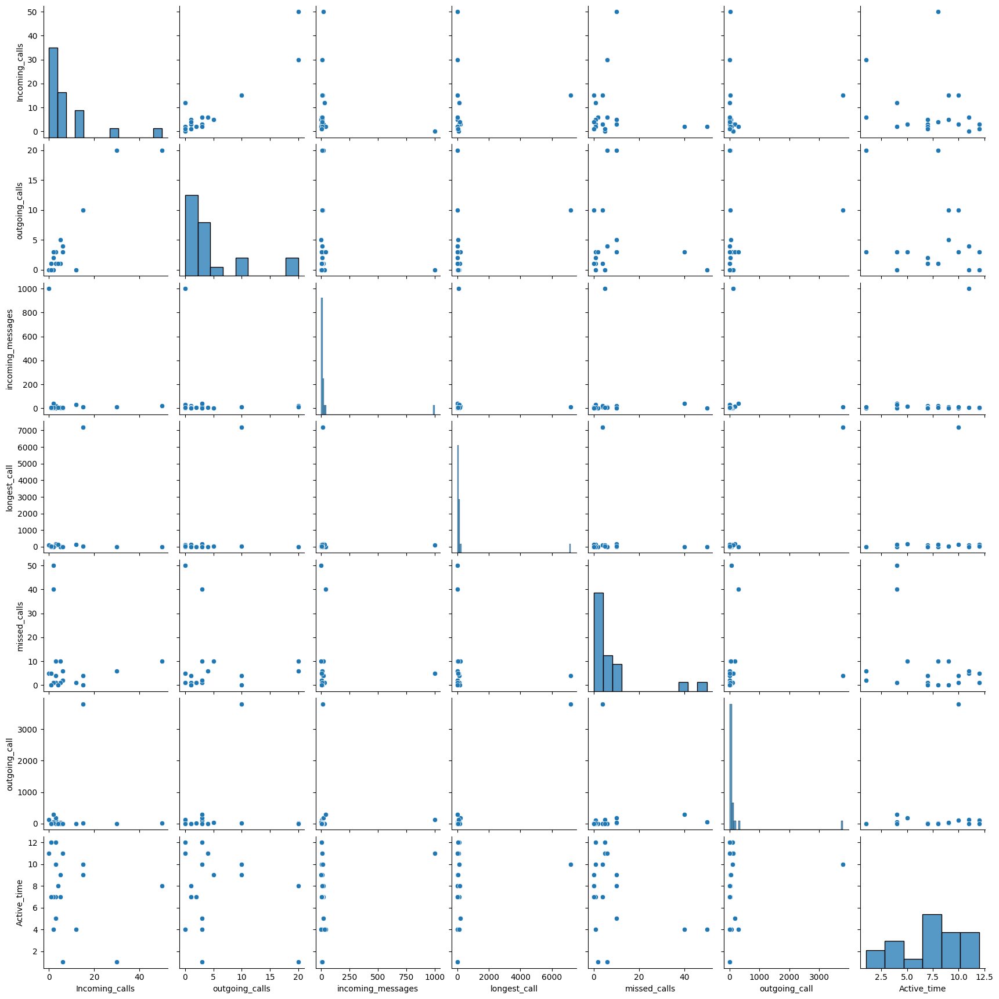

In [ ]:
selected_columns = ['Incoming_calls',	'outgoing_calls',	'incoming_messages',	'longest_call',	'missed_calls',	'outgoing_call',	'Active_time']

# Read the CSV file into a DataFrame
# df = pd.read_csv(csv_file_path)

# Extract the specified columns
selected_df = df[selected_columns]

# Create a pair plot
sns.pairplot(selected_df)
plt.show()

# **References :**

* Turna. GitHub - turna1/GenAI: https://github.com/turna1/GenAI

* Python.org. https://www.python.org/

* Matplotlib — Visualization with Python. https://matplotlib.org/

# **VIDEO PRESENTATION :**

---

## **THANK YOU**



